# Cell-Cell Communication analysis

## Introduction

Here we perform CCC analysis and factorization of cell-cell communication patterns.

## Libraries

In [1]:
import os
import pickle
import numpy as np
import pandas as pd
import h5py
import scanpy as sc
import anndata as ad
import cell2cell as c2c	
import decoupler as dc
import liana as li
from scipy import sparse
from scipy.stats import zscore
import sklearn

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Patch
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
import plotnine as p9
from adjustText import adjust_text

import warnings
warnings.simplefilter(action = 'ignore', category = FutureWarning)
import logging
logging.getLogger("fontTools").setLevel(logging.WARNING)

## Load data

In [2]:
def load_spe(data_dir, h5_path, filter_scov2 = True):
    col_data = pd.read_csv(os.path.join(data_dir, "colData.csv"), index_col=0)
    row_data = pd.read_csv(os.path.join(data_dir, "rowData.csv"), index_col=0)
    umap = pd.read_csv(os.path.join(data_dir, "UMAP.csv"), index_col=0)
    pca = pd.read_csv(os.path.join(data_dir, "PCA.csv"), index_col=0)
    harmony = pd.read_csv(os.path.join(data_dir, "HARMONY.csv"), index_col=0)
    spatial = pd.read_csv(os.path.join(data_dir, "spatialCoords.csv"), index_col=0)

    with h5py.File(os.path.expanduser(h5_path), "r") as f:
        counts = f['assay001'][:]
        logcounts = f['assay002'][:]

    adata = ad.AnnData(X=sparse.csr_matrix(counts), obs=col_data, var=row_data)
    adata.layers["logcounts"]  = logcounts
    adata.obsm["X_umap"] = umap.values
    adata.obsm["X_pca"] = pca.values
    adata.obsm["X_harmony"] = harmony.values
    adata.obsm["spatial"] = spatial.values
    adata.var_names = adata.var["symbol"]
    adata.var_names_make_unique()

    if filter_scov2:
        adata = adata[:, ~adata.var_names.str.startswith('SCoV2_')].copy()

    return adata

In [3]:
base_ccc = "~/SP-COVID/analysis/CCC/out"
base_h5  = "~/SP-COVID/visium/0-processing/out"

adata_lung = load_spe(data_dir = os.path.expanduser(f"{base_ccc}/lung_data/visium"),
                      h5_path  = f"{base_h5}/3-annot_lung_spe/assays.h5")

adata_ln = load_spe(data_dir = os.path.expanduser(f"{base_ccc}/ln_data/visium"),
                    h5_path = f"{base_h5}/3-annot_ln_spe/assays.h5")

adata = ad.concat([adata_lung, adata_ln],
                  join = "inner",
                  merge = "same")

adata.obs_names_make_unique()
adata.obs['cond_tissue'].unique()

/scratch_tmp/64942729/ipykernel_211876/494787918.py:2: DtypeWarning: Columns (12,14) have mixed types. Specify dtype option on import or set low_memory=False.


array(['control_case_1-lung', 'control_case_2-lung',
       'control_case_3-lung', 'acute_case_1-lung', 'acute_case_2-lung',
       'acute_case_3-lung', 'chronic_case_1-lung', 'chronic_case_2-lung',
       'chronic_case_4-lung', 'prolonged_case_3-lung',
       'prolonged_case_5-lung', 'prolonged_case_4-lung',
       'control_case_2-lymph-node', 'acute_case_2-lymph-node',
       'chronic_case_1-lymph-node', 'prolonged_case_5-lymph-node'],
      dtype=object)

## Choosing an optimal bandwidth

The way that spatially-informed methods usually work is by making use of weights based on the proximity (or spatial connectivity) between spots/cells. These spatial connectivities are then used to calculate the metric of interest.

The spatial weights in LIANA+ are by default defined as a family of radial kernels that use the inverse Euclidean distance between cells/spots to bind the weights between 0 and 1, with spots that are closest having the highest spatial connectivity to one another, while those that are thought to be too far to be in contact are assigned 0.

The bandwidth controls the radius of the spatial connectivities, where higher values will result in a broader area being considered.

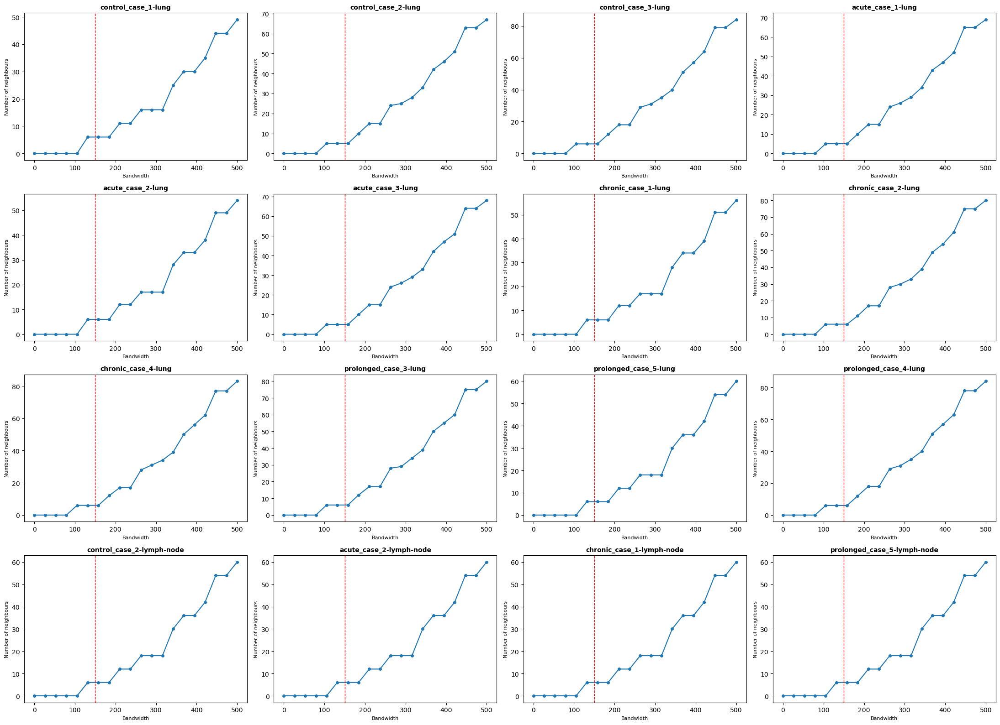

In [4]:
cond_tissues = adata.obs['cond_tissue'].unique()

fig, axes = plt.subplots(nrows = 4, ncols = 4, figsize = (22, 16))
axes_flat = axes.flatten()

for i, cond_tissue in enumerate(cond_tissues):
    ax = axes_flat[i]
    
    mask = adata.obs['cond_tissue'] == cond_tissue
    adata_sub = adata[mask].copy()
    
    _, bw_df = li.ut.query_bandwidth(coordinates = adata_sub.obsm['spatial'],
                                     start = 0, end = 500, interval_n = 20)
    
    ax.plot(bw_df.iloc[:, 0], bw_df.iloc[:, 1], marker = 'o', markersize = 4)
    ax.set_title(f"{cond_tissue}", fontsize = 10, fontweight = 'bold')
    ax.set_xlabel("Bandwidth", fontsize = 8)
    ax.set_ylabel("Number of neighbours", fontsize = 8)
    ax.axvline(x = 150, color = 'red', linestyle = '--', linewidth = 1)


plt.tight_layout()
plt.savefig("out/plots/bandwidth_query.svg", bbox_inches = "tight")
plt.show()

We will keep the default bandwidht, where all the samples have 6 neighbours. i.e. the first ring of neighbours in the hexagonal grid of 10x Visium.:

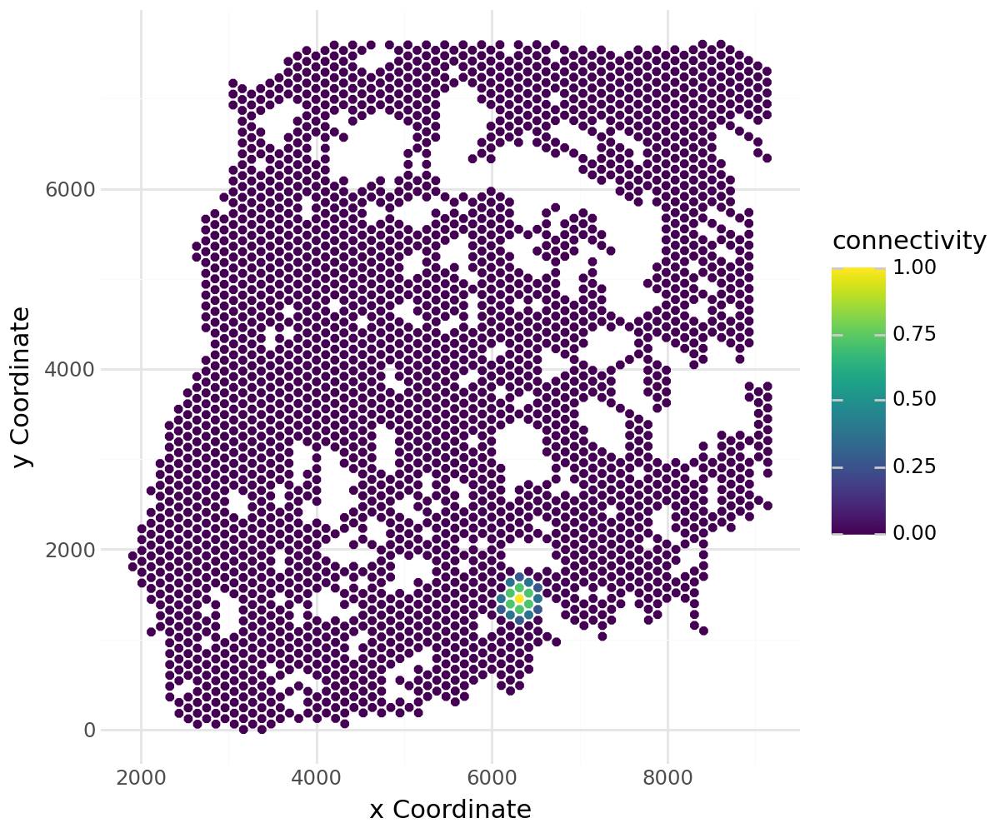

In [5]:
li.ut.spatial_neighbors(adata, bandwidth = 150, set_diag = True, cutoff = 0.1)
li.pl.connectivity(adata[adata.obs['cond_tissue'] == "control_case_1-lung"], 
                   idx = 0, size = 1.3, figure_size = (6, 5))

## Ligand-Receptor inference by sample

In [6]:
lrdatas = {}

for cond_tissue in adata.obs['cond_tissue'].unique():
    adata_sub = adata[adata.obs['cond_tissue'] == cond_tissue].copy()
    adata_sub.var.index.name = 'gene'  
    adata_sub.X = adata_sub.layers['logcounts']
    
    print(f"{cond_tissue}: {adata_sub.n_obs} spots, {adata_sub.n_vars} genes")
    li.ut.spatial_neighbors(adata_sub, bandwidth = 150, set_diag = True, cutoff = 0.1)

    lr = li.mt.bivariate(adata_sub,
                   resource_name = 'consensus', 
                    local_name = 'cosine', 
                    nz_prop = 0.1,
                    n_perms = None, 
                    add_categories = False, 
                    use_raw = False,
                    verbose = True,
                    seed = 42)
    print(f"LR pairs: {lr.n_vars}")
    for col in lr.obs.columns:
        if lr.obs[col].dtype == object:
            try:
                lr.obs[col] = pd.to_numeric(lr.obs[col], errors='raise')
            except (ValueError, TypeError):
                lr.obs[col] = lr.obs[col].astype(str)
    lr.write_h5ad(os.path.join('out', 'lr', cond_tissue + '.h5ad'))
    lrdatas[cond_tissue] = lr
print(lrdatas[list(lrdatas.keys())[0]].var.head())

2026-05-15 11:22:58 | [INFO] Using `.X`!
2026-05-15 11:22:58 | [INFO] Converting to sparse csr matrix!


control_case_1-lung: 2825 spots, 30413 genes


2026-05-15 11:22:59 | [WARNING] 10377 features of mat are empty, they will be removed.
2026-05-15 11:22:59 | [INFO] Using resource `consensus`.
... storing 'sample_id' as categorical
... storing 'cond_tissue' as categorical
... storing 'donor_tissue' as categorical
... storing 'study_id' as categorical
... storing 'disease_group' as categorical
... storing 'sex' as categorical
... storing 'age' as categorical
... storing 'sars.cov.2_antemortem_swap' as categorical
... storing 'sars.cov.2_postmortem_tissue' as categorical
... storing 'sars.cov.2_subgenomicRNA' as categorical
... storing 'tissue' as categorical
... storing 'slide_id' as categorical
... storing 'capture_area' as categorical
... storing 'staining' as categorical
... storing 'annotation' as categorical
... storing 'ligand' as categorical
... storing 'receptor' as categorical


LR pairs: 179


2026-05-15 11:23:03 | [INFO] Using `.X`!
2026-05-15 11:23:03 | [INFO] Converting to sparse csr matrix!


control_case_2-lung: 2075 spots, 30413 genes


2026-05-15 11:23:04 | [WARNING] 7867 features of mat are empty, they will be removed.
2026-05-15 11:23:04 | [INFO] Using resource `consensus`.
... storing 'sample_id' as categorical
... storing 'cond_tissue' as categorical
... storing 'donor_tissue' as categorical
... storing 'study_id' as categorical
... storing 'disease_group' as categorical
... storing 'sex' as categorical
... storing 'age' as categorical
... storing 'sars.cov.2_antemortem_swap' as categorical
... storing 'sars.cov.2_postmortem_tissue' as categorical
... storing 'sars.cov.2_subgenomicRNA' as categorical
... storing 'tissue' as categorical
... storing 'slide_id' as categorical
... storing 'capture_area' as categorical
... storing 'staining' as categorical
... storing 'tcr_id' as categorical
... storing 'annotation' as categorical
... storing 'ligand' as categorical
... storing 'receptor' as categorical


LR pairs: 674


2026-05-15 11:23:09 | [INFO] Using `.X`!
2026-05-15 11:23:09 | [INFO] Converting to sparse csr matrix!


control_case_3-lung: 2571 spots, 30413 genes


2026-05-15 11:23:10 | [WARNING] 10271 features of mat are empty, they will be removed.
2026-05-15 11:23:10 | [INFO] Using resource `consensus`.
... storing 'sample_id' as categorical
... storing 'cond_tissue' as categorical
... storing 'donor_tissue' as categorical
... storing 'study_id' as categorical
... storing 'disease_group' as categorical
... storing 'sex' as categorical
... storing 'age' as categorical
... storing 'sars.cov.2_antemortem_swap' as categorical
... storing 'sars.cov.2_postmortem_tissue' as categorical
... storing 'sars.cov.2_subgenomicRNA' as categorical
... storing 'tissue' as categorical
... storing 'slide_id' as categorical
... storing 'capture_area' as categorical
... storing 'staining' as categorical
... storing 'annotation' as categorical
... storing 'ligand' as categorical
... storing 'receptor' as categorical


LR pairs: 346


2026-05-15 11:23:14 | [INFO] Using `.X`!
2026-05-15 11:23:14 | [INFO] Converting to sparse csr matrix!


acute_case_1-lung: 1877 spots, 30413 genes


2026-05-15 11:23:15 | [WARNING] 10043 features of mat are empty, they will be removed.
2026-05-15 11:23:15 | [INFO] Using resource `consensus`.
... storing 'sample_id' as categorical
... storing 'cond_tissue' as categorical
... storing 'donor_tissue' as categorical
... storing 'study_id' as categorical
... storing 'disease_group' as categorical
... storing 'sex' as categorical
... storing 'age' as categorical
... storing 'sars.cov.2_antemortem_swap' as categorical
... storing 'sars.cov.2_subgenomicRNA' as categorical
... storing 'nucleocapsid_IHC' as categorical
... storing 'tissue' as categorical
... storing 'slide_id' as categorical
... storing 'capture_area' as categorical
... storing 'staining' as categorical
... storing 'annotation' as categorical
... storing 'ligand' as categorical
... storing 'receptor' as categorical


LR pairs: 360


2026-05-15 11:23:20 | [INFO] Using `.X`!
2026-05-15 11:23:20 | [INFO] Converting to sparse csr matrix!


acute_case_2-lung: 3177 spots, 30413 genes


2026-05-15 11:23:20 | [WARNING] 8703 features of mat are empty, they will be removed.
2026-05-15 11:23:20 | [INFO] Using resource `consensus`.
... storing 'sample_id' as categorical
... storing 'cond_tissue' as categorical
... storing 'donor_tissue' as categorical
... storing 'study_id' as categorical
... storing 'disease_group' as categorical
... storing 'sex' as categorical
... storing 'age' as categorical
... storing 'sars.cov.2_antemortem_swap' as categorical
... storing 'sars.cov.2_subgenomicRNA' as categorical
... storing 'nucleocapsid_IHC' as categorical
... storing 'tissue' as categorical
... storing 'slide_id' as categorical
... storing 'capture_area' as categorical
... storing 'staining' as categorical
... storing 'tcr_id' as categorical
... storing 'annotation' as categorical
... storing 'ligand' as categorical
... storing 'receptor' as categorical


LR pairs: 325


2026-05-15 11:23:25 | [INFO] Using `.X`!
2026-05-15 11:23:25 | [INFO] Converting to sparse csr matrix!


acute_case_3-lung: 1852 spots, 30413 genes


2026-05-15 11:23:26 | [WARNING] 10247 features of mat are empty, they will be removed.
2026-05-15 11:23:26 | [INFO] Using resource `consensus`.
... storing 'sample_id' as categorical
... storing 'cond_tissue' as categorical
... storing 'donor_tissue' as categorical
... storing 'study_id' as categorical
... storing 'disease_group' as categorical
... storing 'sex' as categorical
... storing 'age' as categorical
... storing 'sars.cov.2_antemortem_swap' as categorical
... storing 'sars.cov.2_subgenomicRNA' as categorical
... storing 'nucleocapsid_IHC' as categorical
... storing 'tissue' as categorical
... storing 'slide_id' as categorical
... storing 'capture_area' as categorical
... storing 'staining' as categorical
... storing 'annotation' as categorical
... storing 'ligand' as categorical
... storing 'receptor' as categorical


LR pairs: 530


2026-05-15 11:23:30 | [INFO] Using `.X`!
2026-05-15 11:23:30 | [INFO] Converting to sparse csr matrix!


chronic_case_1-lung: 2890 spots, 30413 genes


2026-05-15 11:23:31 | [WARNING] 9593 features of mat are empty, they will be removed.
2026-05-15 11:23:31 | [INFO] Using resource `consensus`.
... storing 'sample_id' as categorical
... storing 'cond_tissue' as categorical
... storing 'donor_tissue' as categorical
... storing 'study_id' as categorical
... storing 'disease_group' as categorical
... storing 'sex' as categorical
... storing 'age' as categorical
... storing 'sars.cov.2_antemortem_swap' as categorical
... storing 'sars.cov.2_subgenomicRNA' as categorical
... storing 'nucleocapsid_IHC' as categorical
... storing 'tissue' as categorical
... storing 'slide_id' as categorical
... storing 'capture_area' as categorical
... storing 'staining' as categorical
... storing 'tcr_id' as categorical
... storing 'annotation' as categorical
... storing 'ligand' as categorical
... storing 'receptor' as categorical


LR pairs: 425


2026-05-15 11:23:36 | [INFO] Using `.X`!
2026-05-15 11:23:36 | [INFO] Converting to sparse csr matrix!


chronic_case_2-lung: 2886 spots, 30413 genes


2026-05-15 11:23:37 | [WARNING] 9535 features of mat are empty, they will be removed.
2026-05-15 11:23:37 | [INFO] Using resource `consensus`.
... storing 'sample_id' as categorical
... storing 'cond_tissue' as categorical
... storing 'donor_tissue' as categorical
... storing 'study_id' as categorical
... storing 'disease_group' as categorical
... storing 'sex' as categorical
... storing 'age' as categorical
... storing 'sars.cov.2_antemortem_swap' as categorical
... storing 'sars.cov.2_subgenomicRNA' as categorical
... storing 'tissue' as categorical
... storing 'slide_id' as categorical
... storing 'capture_area' as categorical
... storing 'staining' as categorical
... storing 'annotation' as categorical
... storing 'ligand' as categorical
... storing 'receptor' as categorical


LR pairs: 326


2026-05-15 11:23:42 | [INFO] Using `.X`!
2026-05-15 11:23:42 | [INFO] Converting to sparse csr matrix!


chronic_case_4-lung: 3813 spots, 30413 genes


2026-05-15 11:23:44 | [WARNING] 3994 features of mat are empty, they will be removed.
2026-05-15 11:23:44 | [INFO] Using resource `consensus`.
... storing 'sample_id' as categorical
... storing 'cond_tissue' as categorical
... storing 'donor_tissue' as categorical
... storing 'study_id' as categorical
... storing 'disease_group' as categorical
... storing 'sex' as categorical
... storing 'age' as categorical
... storing 'sars.cov.2_antemortem_swap' as categorical
... storing 'sars.cov.2_subgenomicRNA' as categorical
... storing 'nucleocapsid_IHC' as categorical
... storing 'tissue' as categorical
... storing 'slide_id' as categorical
... storing 'capture_area' as categorical
... storing 'staining' as categorical
... storing 'tcr_id' as categorical
... storing 'annotation' as categorical
... storing 'ligand' as categorical
... storing 'receptor' as categorical


LR pairs: 1470


2026-05-15 11:23:55 | [INFO] Using `.X`!
2026-05-15 11:23:55 | [INFO] Converting to sparse csr matrix!


prolonged_case_3-lung: 3027 spots, 30413 genes


2026-05-15 11:23:55 | [WARNING] 7953 features of mat are empty, they will be removed.
2026-05-15 11:23:56 | [INFO] Using resource `consensus`.
... storing 'sample_id' as categorical
... storing 'cond_tissue' as categorical
... storing 'donor_tissue' as categorical
... storing 'study_id' as categorical
... storing 'disease_group' as categorical
... storing 'sex' as categorical
... storing 'age' as categorical
... storing 'sars.cov.2_antemortem_swap' as categorical
... storing 'sars.cov.2_subgenomicRNA' as categorical
... storing 'nucleocapsid_IHC' as categorical
... storing 'tissue' as categorical
... storing 'slide_id' as categorical
... storing 'capture_area' as categorical
... storing 'staining' as categorical
... storing 'annotation' as categorical
... storing 'ligand' as categorical
... storing 'receptor' as categorical


LR pairs: 608


2026-05-15 11:24:02 | [INFO] Using `.X`!
2026-05-15 11:24:02 | [INFO] Converting to sparse csr matrix!


prolonged_case_5-lung: 3378 spots, 30413 genes


2026-05-15 11:24:02 | [WARNING] 7658 features of mat are empty, they will be removed.
2026-05-15 11:24:03 | [INFO] Using resource `consensus`.
... storing 'sample_id' as categorical
... storing 'cond_tissue' as categorical
... storing 'donor_tissue' as categorical
... storing 'study_id' as categorical
... storing 'disease_group' as categorical
... storing 'sex' as categorical
... storing 'age' as categorical
... storing 'sars.cov.2_antemortem_swap' as categorical
... storing 'sars.cov.2_subgenomicRNA' as categorical
... storing 'tissue' as categorical
... storing 'slide_id' as categorical
... storing 'capture_area' as categorical
... storing 'staining' as categorical
... storing 'tcr_id' as categorical
... storing 'annotation' as categorical
... storing 'ligand' as categorical
... storing 'receptor' as categorical


LR pairs: 519


2026-05-15 11:24:09 | [INFO] Using `.X`!
2026-05-15 11:24:09 | [INFO] Converting to sparse csr matrix!


prolonged_case_4-lung: 2840 spots, 30413 genes


2026-05-15 11:24:09 | [WARNING] 6439 features of mat are empty, they will be removed.
2026-05-15 11:24:09 | [INFO] Using resource `consensus`.
... storing 'sample_id' as categorical
... storing 'cond_tissue' as categorical
... storing 'donor_tissue' as categorical
... storing 'study_id' as categorical
... storing 'disease_group' as categorical
... storing 'sex' as categorical
... storing 'age' as categorical
... storing 'sars.cov.2_antemortem_swap' as categorical
... storing 'sars.cov.2_subgenomicRNA' as categorical
... storing 'tissue' as categorical
... storing 'slide_id' as categorical
... storing 'capture_area' as categorical
... storing 'staining' as categorical
... storing 'tcr_id' as categorical
... storing 'annotation' as categorical
... storing 'ligand' as categorical
... storing 'receptor' as categorical


LR pairs: 741


2026-05-15 11:24:16 | [INFO] Using `.X`!
2026-05-15 11:24:16 | [INFO] Converting to sparse csr matrix!


control_case_2-lymph-node: 4149 spots, 30413 genes


2026-05-15 11:24:17 | [WARNING] 4856 features of mat are empty, they will be removed.
2026-05-15 11:24:18 | [INFO] Using resource `consensus`.
... storing 'sample_id' as categorical
... storing 'cond_tissue' as categorical
... storing 'donor_tissue' as categorical
... storing 'study_id' as categorical
... storing 'disease_group' as categorical
... storing 'sex' as categorical
... storing 'age' as categorical
... storing 'sars.cov.2_antemortem_swap' as categorical
... storing 'sars.cov.2_postmortem_tissue' as categorical
... storing 'sars.cov.2_subgenomicRNA' as categorical
... storing 'nucleocapsid_IHC' as categorical
... storing 'tissue' as categorical
... storing 'lung_fibrosis_score' as categorical
... storing 'slide_id' as categorical
... storing 'capture_area' as categorical
... storing 'staining' as categorical
... storing 'tcr_id' as categorical
... storing 'annotation' as categorical
... storing 'ligand' as categorical
... storing 'receptor' as categorical


LR pairs: 1153


2026-05-15 11:24:27 | [INFO] Using `.X`!
2026-05-15 11:24:27 | [INFO] Converting to sparse csr matrix!


acute_case_2-lymph-node: 2254 spots, 30413 genes


2026-05-15 11:24:28 | [WARNING] 6427 features of mat are empty, they will be removed.
2026-05-15 11:24:28 | [INFO] Using resource `consensus`.
... storing 'sample_id' as categorical
... storing 'cond_tissue' as categorical
... storing 'donor_tissue' as categorical
... storing 'study_id' as categorical
... storing 'disease_group' as categorical
... storing 'sex' as categorical
... storing 'age' as categorical
... storing 'sars.cov.2_antemortem_swap' as categorical
... storing 'sars.cov.2_subgenomicRNA' as categorical
... storing 'nucleocapsid_IHC' as categorical
... storing 'tissue' as categorical
... storing 'lung_fibrosis_score' as categorical
... storing 'slide_id' as categorical
... storing 'capture_area' as categorical
... storing 'staining' as categorical
... storing 'tcr_id' as categorical
... storing 'annotation' as categorical
... storing 'ligand' as categorical
... storing 'receptor' as categorical


LR pairs: 1149


2026-05-15 11:24:36 | [INFO] Using `.X`!
2026-05-15 11:24:36 | [INFO] Converting to sparse csr matrix!


chronic_case_1-lymph-node: 2891 spots, 30413 genes


2026-05-15 11:24:37 | [WARNING] 6502 features of mat are empty, they will be removed.
2026-05-15 11:24:37 | [INFO] Using resource `consensus`.
... storing 'sample_id' as categorical
... storing 'cond_tissue' as categorical
... storing 'donor_tissue' as categorical
... storing 'study_id' as categorical
... storing 'disease_group' as categorical
... storing 'sex' as categorical
... storing 'age' as categorical
... storing 'sars.cov.2_antemortem_swap' as categorical
... storing 'sars.cov.2_subgenomicRNA' as categorical
... storing 'nucleocapsid_IHC' as categorical
... storing 'tissue' as categorical
... storing 'lung_fibrosis_score' as categorical
... storing 'slide_id' as categorical
... storing 'capture_area' as categorical
... storing 'staining' as categorical
... storing 'tcr_id' as categorical
... storing 'annotation' as categorical
... storing 'ligand' as categorical
... storing 'receptor' as categorical


LR pairs: 1131


2026-05-15 11:24:45 | [INFO] Using `.X`!
2026-05-15 11:24:45 | [INFO] Converting to sparse csr matrix!


prolonged_case_5-lymph-node: 2347 spots, 30413 genes


2026-05-15 11:24:46 | [WARNING] 6587 features of mat are empty, they will be removed.
2026-05-15 11:24:46 | [INFO] Using resource `consensus`.
... storing 'sample_id' as categorical
... storing 'cond_tissue' as categorical
... storing 'donor_tissue' as categorical
... storing 'study_id' as categorical
... storing 'disease_group' as categorical
... storing 'sex' as categorical
... storing 'age' as categorical
... storing 'sars.cov.2_antemortem_swap' as categorical
... storing 'sars.cov.2_subgenomicRNA' as categorical
... storing 'tissue' as categorical
... storing 'lung_fibrosis_score' as categorical
... storing 'slide_id' as categorical
... storing 'capture_area' as categorical
... storing 'staining' as categorical
... storing 'tcr_id' as categorical
... storing 'annotation' as categorical
... storing 'ligand' as categorical
... storing 'receptor' as categorical


LR pairs: 1160
            ligand receptor  ligand_means  ligand_props  receptor_means  \
interaction                                                               
HLA-A^APLP2  HLA-A    APLP2      1.815188      0.636106        1.008737   
APP^CD74       APP     CD74      0.618777      0.270088        1.096768   
APP^LRP1       APP     LRP1      0.618777      0.270088        0.463658   
APP^AGER       APP     AGER      0.618777      0.270088        0.399241   
APP^LRP10      APP    LRP10      0.618777      0.270088        0.273931   

             receptor_props      mean       std  
interaction                                      
HLA-A^APLP2        0.402832  0.468586  0.184384  
APP^CD74           0.427965  0.291843  0.202082  
APP^LRP1           0.207080  0.209519  0.197739  
APP^AGER           0.173451  0.179346  0.194590  
APP^LRP10          0.127434  0.179135  0.209780  


In [7]:
lrdata_all = ad.concat(lrdatas, label = 'cond_tissue', join = 'outer')
print(lrdata_all)

AnnData object with n_obs × n_vars = 44852 × 1770
    obs: 'in_tissue', 'array_row', 'array_col', 'sample_id', 'cond_tissue', 'donor_tissue', 'study_id', 'disease_group', 'sex', 'age', 'sars.cov.2_antemortem_swap', 'sars.cov.2_postmortem_tissue', 'sars.cov.2_subgenomicRNA', 'nucleocapsid_IHC', 'tissue', 'lung_fibrosis_score', 'slide_id', 'capture_area', 'staining', 'sample_number', 'tcr_id', 'sum', 'detected', 'subsets_mito_sum', 'subsets_mito_detected', 'subsets_mito_percent', 'subsets_ribo_sum', 'subsets_ribo_detected', 'subsets_ribo_percent', 'subsets_SCoV2_sum', 'subsets_SCoV2_detected', 'subsets_SCoV2_percent', 'total', 'low_lib_size', 'low_n_features', 'discard', 'sizeFactor', 'lisi_study_id', 'annotation'
    obsm: 'X_umap', 'X_pca', 'X_harmony', 'spatial'


## LR pairs factorization with NMF (Non-negative Matrix Factorization)

As we have 3 replicates per disease stage in lung samples, we will not consider LR pairs present in only 1 or 2 samples for NMF factorization. 

LR pairs: 1770


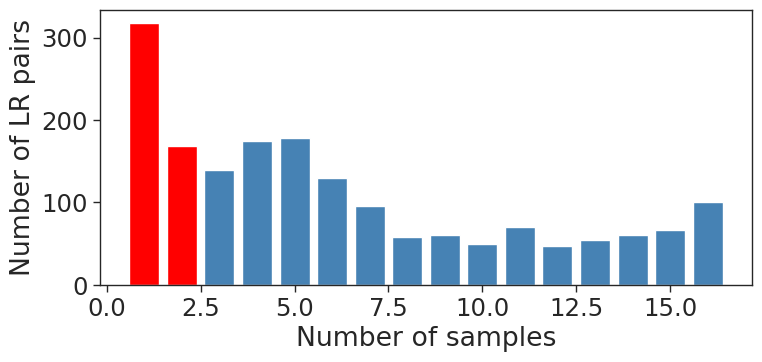

In [8]:
features = pd.concat([lrdatas[cond_tissue].var for cond_tissue in lrdatas])
features['count'] = 1
features = features.reset_index().groupby('interaction').sum().sort_values('count')
print(f"LR pairs: {len(features)}")

counts = features['count'].value_counts().sort_index()
colors = ['red' if i < 2 else 'steelblue' for i in range(len(counts))]

sns.set_theme(style = "ticks", context = "paper", font_scale = 2)
fig, ax = plt.subplots(figsize = (8, 4))
ax.bar(counts.index, counts.values, color = colors, edgecolor = 'white', linewidth = 1)
ax.set_xlabel("Number of samples")
ax.set_ylabel("Number of LR pairs")
plt.tight_layout()
plt.savefig("out/plots/LR_nsamples.svg", bbox_inches = "tight")
plt.show()

In [9]:
features = features[features['count'] >= 3]
print(f"LR pairs retained: {len(features)}")

lrdata_all = sc.concat(lrdatas, join = 'outer', fill_value = 0)
lrdata_all = lrdata_all[:, features.index]
lrdata_all

LR pairs retained: 1283


View of AnnData object with n_obs × n_vars = 44852 × 1283
    obs: 'in_tissue', 'array_row', 'array_col', 'sample_id', 'cond_tissue', 'donor_tissue', 'study_id', 'disease_group', 'sex', 'age', 'sars.cov.2_antemortem_swap', 'sars.cov.2_postmortem_tissue', 'sars.cov.2_subgenomicRNA', 'nucleocapsid_IHC', 'tissue', 'lung_fibrosis_score', 'slide_id', 'capture_area', 'staining', 'sample_number', 'tcr_id', 'sum', 'detected', 'subsets_mito_sum', 'subsets_mito_detected', 'subsets_mito_percent', 'subsets_ribo_sum', 'subsets_ribo_detected', 'subsets_ribo_percent', 'subsets_SCoV2_sum', 'subsets_SCoV2_detected', 'subsets_SCoV2_percent', 'total', 'low_lib_size', 'low_n_features', 'discard', 'sizeFactor', 'lisi_study_id', 'annotation'
    obsm: 'X_umap', 'X_pca', 'X_harmony', 'spatial'

Now we will fit the NMF to our whole dataset of LR pairs to decompose the LR interaction scores across spots and samples into a set of spatial communication patterns.

Conceptually, we will factorizes our data matrix (spots × LR pairs) into:

- NMF_W — spot loadings: how much each spot contributes to each pattern
- NMF_H — LR pair loadings: which LR pairs define each pattern

So each pattern is a spatially co-varying group of LR interactions.

In [10]:
li.multi.nmf(lrdata_all, 
             n_components = None, 
             inplace = True, 
             max_iter = 400, 
             k_range = range(1, 21),
             verbose = True,
             random_state = 42)
for col in lrdata_all.obs.columns:
    if lrdata_all.obs[col].dtype == object:
        try:
            lrdata_all.obs[col] = pd.to_numeric(lrdata_all.obs[col], errors='raise')
        except (ValueError, TypeError):
            lrdata_all.obs[col] = lrdata_all.obs[col].astype(str)
lrdata_all.write_h5ad(os.path.join('out', 'lrdata_all.h5ad'))

100%|███████████████████████████████████████████| 20/20 [19:14<00:00, 57.75s/it]
2026-05-15 11:44:09 | [INFO] Estimated rank: 5
/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/sklearn/decomposition/_nmf.py:1720: ConvergenceWarning: Maximum number of iterations 400 reached. Increase it to improve convergence.
/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/liana/multi/_nmf.py:74: ImplicitModificationWarning: Setting element `.obsm['NMF_W']` of view, initializing view as actual.
... storing 'sars.cov.2_postmortem_tissue' as categorical
... storing 'nucleocapsid_IHC' as categorical
... storing 'lung_fibrosis_score' as categorical
... storing 'tcr_id' as categorical


Below we can see the estimation of the optimal number of components (rank) that `li.multi.nmf`performed using the elbow method.

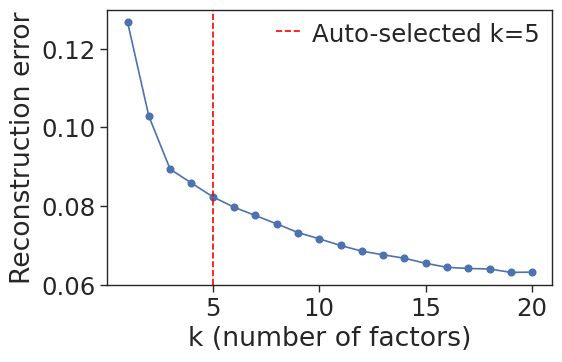

In [11]:
errors = lrdata_all.uns['nmf_errors']
rank = lrdata_all.uns['nmf_rank']

sns.set_theme(style = "ticks", context = "paper", font_scale = 2)
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(errors['k'], errors['error'], marker='o')
ax.axvline(x=rank, linestyle='--', color='red', label=f'Auto-selected k={rank}')
ax.set_xlabel('k (number of factors)')
ax.set_ylabel('Reconstruction error')
ax.legend(frameon = False)
plt.tight_layout()
plt.savefig("out/plots/kneeplot.svg", bbox_inches = "tight")
plt.show()

In [12]:
# LR loadings
lr_loadings = li.ut.get_variable_loadings(lrdata_all, varm_key = 'NMF_H').set_index('index')

# Spot loadings
spot_loadings = ad.AnnData(X = lrdata_all.obsm["NMF_W"], obs = lrdata_all.obs)
spot_loadings.var_names = [f"Factor {i+1}" for i in range(5)]

psbulk = dc.pp.pseudobulk(spot_loadings,
                           sample_col = 'cond_tissue',
                           groups_col = None,
                           mode = 'mean',
                           skip_checks = True)

spot_loadings_bulk = pd.DataFrame(psbulk.X, index = psbulk.obs_names, columns = psbulk.var_names)

spot_loadings_bulk["disease_group"] = psbulk.obs["disease_group"].values
spot_loadings_bulk["tissue"] = psbulk.obs["tissue"].values

spot_loadings_bulk_l = spot_loadings_bulk.melt(id_vars = ["disease_group", "tissue"],
                                               var_name = "factor",
                                               value_name = "loading")

In [13]:
metadata = (adata.obs
    .groupby('cond_tissue')
    .first() 
    .reset_index()
    [['cond_tissue', 'disease_group', 'donor_tissue', 'study_id', 
      'slide_id', 'capture_area', 'sex', 'age', 'tissue',
      'lung_fibrosis_score', 'sample_id']])
metadata = metadata.set_index('cond_tissue')
metadata.head()

,disease_group,donor_tissue,study_id,slide_id,capture_area,sex,age,tissue,lung_fibrosis_score,sample_id
cond_tissue,,,,,,,,,,
acute_case_1-lung,acute,O325-lung,acute_case_1,V10T12-376,B1,m,80-84,lung,2.93,O325-lung
acute_case_2-lung,acute,S293-lung,acute_case_2,V10J29-047,A1,m,90-94,lung,1.88,S293-lung
acute_case_2-lymph-node,acute,S293-lymph-node,acute_case_2,V11F16-324,B1,m,90-94,lymph-node,na,S293-lymph-node
acute_case_3-lung,acute,T128-lung,acute_case_3,V10T12-276,B1,m,75-79,lung,2.73,T128-lung
chronic_case_1-lung,chronic,A333-lung,chronic_case_1,V10J29-047,C1,m,60-64,lung,2.68,A333-lung


## Spot loadings analysis

Spot loadings (W matrix) represent each spot's contribution to the 5 NMF factors capturing spatial LR communication patterns. To conduct spot loading analysis, we will aggregate the NMF-derived loadings into sample-level pseudobulks and perform hypothesis testing across tissues and disease stages. We will perform the following tests: 

- **Tissue effect:** Mann-Whitney U (12 lung vs 4 LN pseudobulks per factor), independence justified by distinct tissue microenvironments despite 4 shared patients.
- **Disease stage effect:** Kruskal-Wallis (4 conditions × 4 reps), with FDR-corrected Dunn's post-hoc of all samples and of lung samples (4 conditions × 3 reps).
- **Correction:** FDR (BH) across 5 factors controls false discoveries among differential patterns.

This will identify condition/tissue-specific spatial communication signatures robust to non-normality.

Before the analysis, we can explore the spot loadings on the spatial plots: 

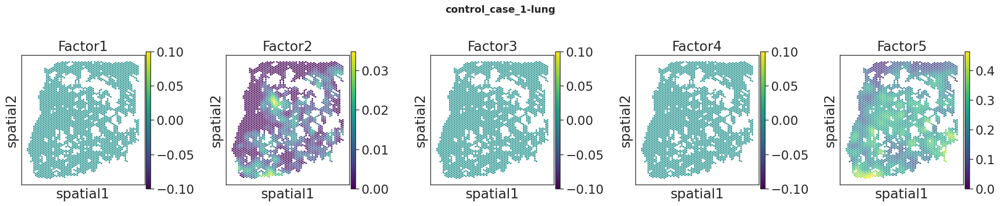

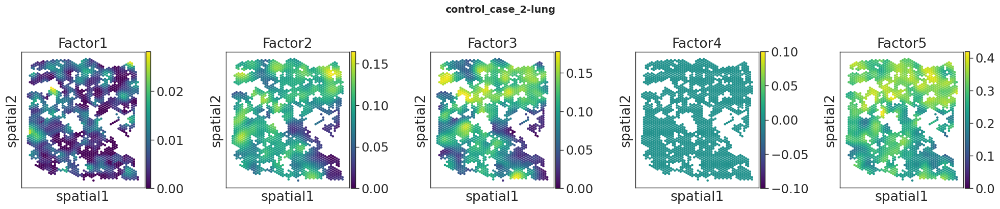

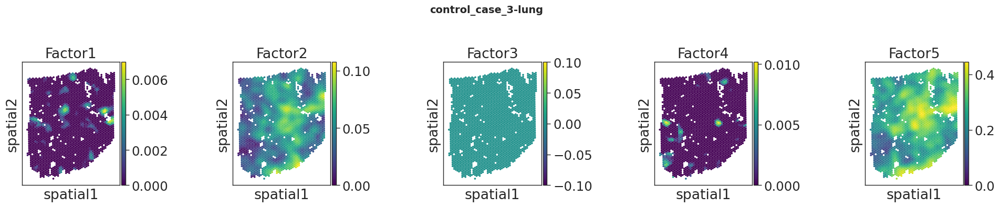

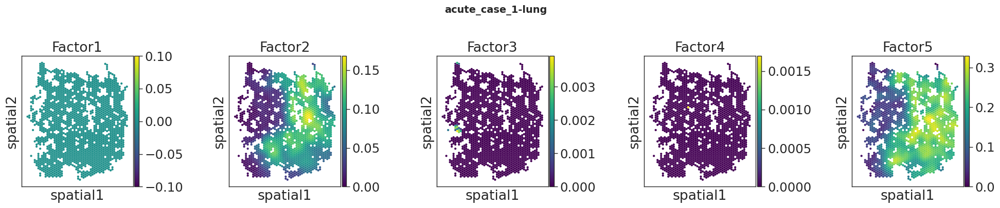

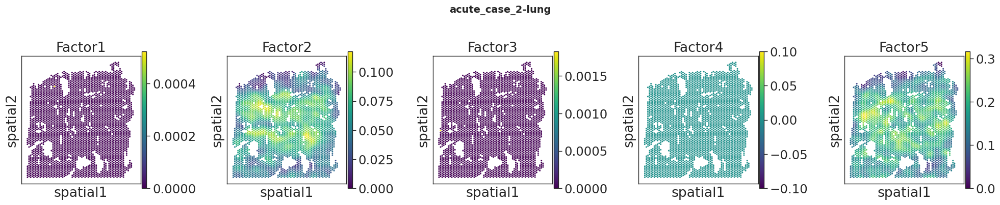

...

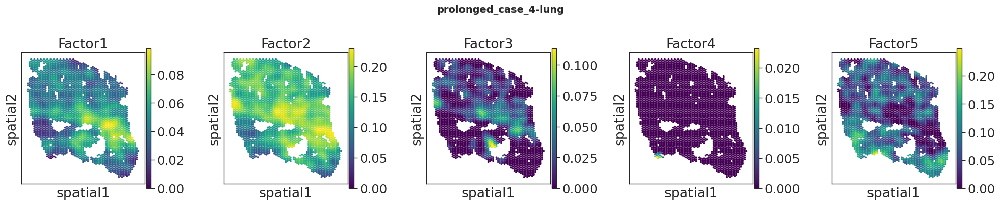

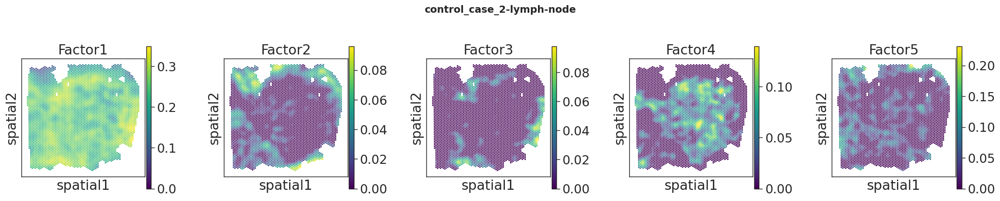

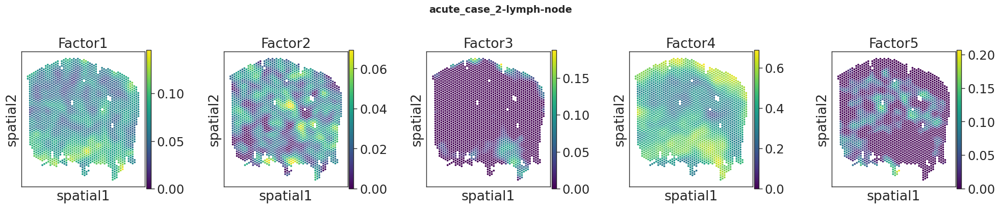

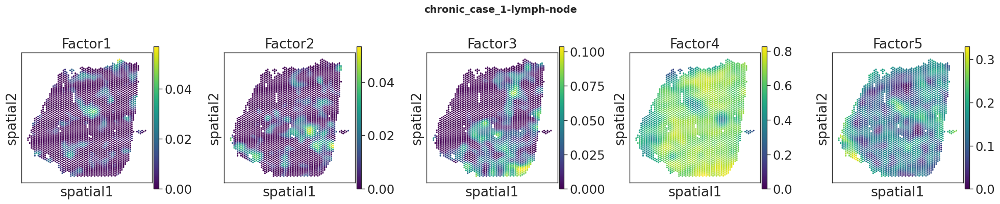

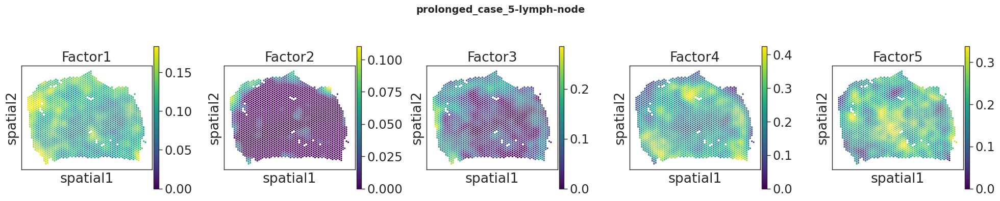

In [14]:
for sample in lrdatas:
    lrdata = lrdatas[sample]
    temp = lrdata_all[lrdata_all.obs.index.isin(lrdata.obs.index), :]
    temp = temp[:, temp.var.index.isin(lrdata.var.index)]
    
    spot_loadings = sc.AnnData(X = temp.obsm['NMF_W'],
                        obs = temp.obs,
                        var = pd.DataFrame(index = lr_loadings.columns),
                        uns = lrdata.uns,
                        obsm = {'spatial': temp.obsm['spatial']})

    fig, axes = plt.subplots(1, 5, figsize = (20, 4))
    axes_flat = axes.flatten()

    for i, factor in enumerate(lr_loadings.columns):
        sc.pl.spatial(spot_loadings,
                      color = factor,
                      cmap = 'viridis',
                      title = factor,
                      vmin = 0,
                      spot_size = 100,
                      ax = axes_flat[i],
                      show = False)

    fig.suptitle(f"{sample}", fontsize = 14, fontweight = 'bold', y = 1.01)
    plt.tight_layout()
    plt.savefig(f"out/plots/spatial/NMF_spatial_{sample}.svg", bbox_inches = "tight")
    plt.show()

### Tissue effect

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

lymph-node vs. lung: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.265e-02 U_stat=4.500e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

lymph-node vs. lung: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.703e-01 U_stat=1.200e+01


/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/cell2cell/plotting/factor_plot.py:197: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/cell2cell/plotting/factor_plot.py:197: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

lymph-node vs. lung: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.617e-01 U_stat=3.200e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

lymph-node vs. lung: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.260e-03 U_stat=4.800e+01


/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/cell2cell/plotting/factor_plot.py:197: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/cell2cell/plotting/factor_plot.py:197: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

lymph-node vs. lung: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:7.802e-02 U_stat=9.000e+00


/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/cell2cell/plotting/factor_plot.py:197: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


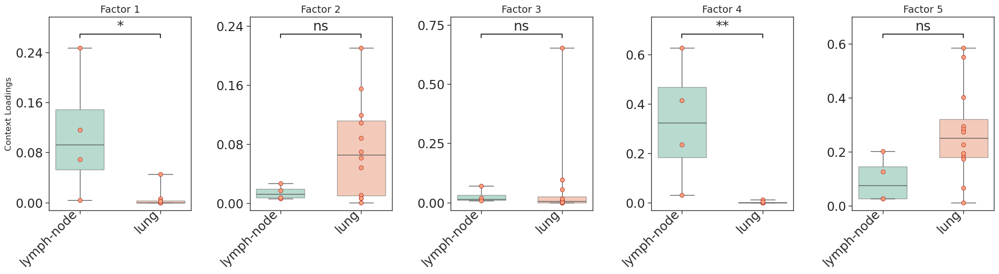

In [15]:
tissue_effect = spot_loadings_bulk_l.copy()
tissue_effect["context"] = (tissue_effect["disease_group"].astype(str) + "_" + tissue_effect["tissue"].astype(str) + "_" 
                            + tissue_effect.groupby(["disease_group", "tissue"]).cumcount().astype(str))
tissue_effect_w = tissue_effect.pivot(index = "context", columns = "factor", values = "loading")

metadict = (tissue_effect[["context", "tissue"]]
    .drop_duplicates()
    .set_index("context")["tissue"]
    .to_dict())

fig, axes = c2c.plotting.context_boxplot(context_loadings = tissue_effect_w,
                                         metadict = metadict,
                                         verbose = True,
                                         statistical_test = 'Mann-Whitney',
                                         pval_correction = 'fdr_bh',
                                         text_format = 'star',
                                         cmap = 'Set2', 
                                         figsize = (20, 6))
for ax in axes.flatten():
    ax.yaxis.set_major_locator(ticker.MaxNLocator(nbins = 4))
fig.savefig("out/plots/NMF_tissue_effect.svg", bbox_inches = "tight")

### Stage effect (all samples)

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

control vs. acute: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:3.749e-01 Stat=7.875e-01
acute vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:2.454e-01 Stat=1.349e+00
chronic vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:2.482e-01 Stat=1.333e+00
control vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:5.637e-01 Stat=3.333e-01
acute vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:1.465e-01 Stat=2.108e+00
control vs. prolonged: Kruskal-Wallis independent samples (pairwi

/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/cell2cell/plotting/factor_plot.py:197: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


acute vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:1.489e-01 Stat=2.083e+00
chronic vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:2.482e-01 Stat=1.333e+00
control vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:3.865e-01 Stat=7.500e-01
acute vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:1.000e+00 Stat=0.000e+00
control vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:5.637e-01 Stat=3.333e-01


/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/cell2cell/plotting/factor_plot.py:197: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

control vs. acute: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:5.614e-01 Stat=3.373e-01
acute vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:5.637e-01 Stat=3.333e-01
chronic vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:7.728e-01 Stat=8.333e-02
control vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:3.749e-01 Stat=7.875e-01
acute vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:8.326e-02 Stat=3.000e+00
control vs. prolonged: Kruskal-Wallis independent samples (pairwi

/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/cell2cell/plotting/factor_plot.py:197: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

control vs. acute: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:5.541e-01 Stat=3.500e-01
acute vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:2.482e-01 Stat=1.333e+00
chronic vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:3.865e-01 Stat=7.500e-01
control vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:2.454e-01 Stat=1.349e+00
acute vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:7.728e-01 Stat=8.333e-02
control vs. prolonged: Kruskal-Wallis independent samples (pairwi

/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/cell2cell/plotting/factor_plot.py:197: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


acute vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:1.489e-01 Stat=2.083e+00
chronic vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:2.482e-01 Stat=1.333e+00
control vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:1.489e-01 Stat=2.083e+00
acute vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:7.728e-01 Stat=8.333e-02
control vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:5.637e-01 Stat=3.333e-01


/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/cell2cell/plotting/factor_plot.py:197: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


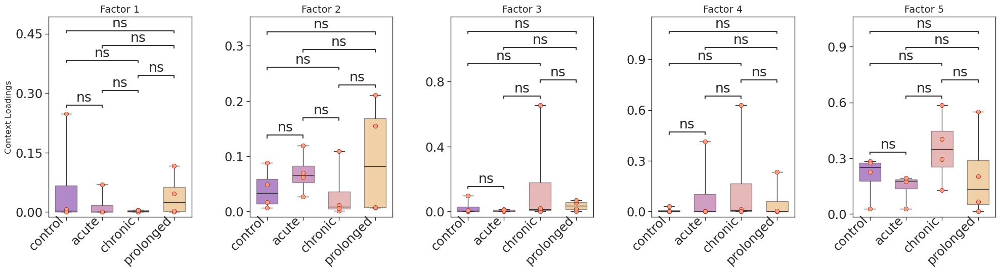

In [16]:
stage_effect = spot_loadings_bulk_l.copy()
stage_effect["context"] = (stage_effect["disease_group"].astype(str) + "_" + stage_effect["tissue"].astype(str) + "_" 
                           + stage_effect.groupby(["disease_group", "tissue"]).cumcount().astype(str))
stage_effect_w = stage_effect.pivot(index = "context", columns = "factor", values = "loading")

metadict = (stage_effect[["context", "disease_group"]]
    .drop_duplicates()
    .set_index("context")["disease_group"]
    .to_dict())

fig, axes = c2c.plotting.context_boxplot(context_loadings = stage_effect_w,
                                         metadict = metadict,
                                         verbose = True,
                                         group_order = ["control", "acute", "chronic", "prolonged"],
                                         statistical_test = 'Kruskal',
                                         pval_correction = 'fdr_bh',
                                         text_format = 'star',
                                         cmap = 'plasma', 
                                         figsize=(20, 6))
for ax in axes.flatten():
    ax.yaxis.set_major_locator(ticker.MaxNLocator(nbins = 4))

### Stage effect (per tissue)

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

control vs. acute: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:2.463e-01 Stat=1.344e+00
acute vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:4.630e-02 (ns) Stat=3.971e+00
chronic vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:2.752e-01 Stat=1.190e+00
control vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:8.273e-01 Stat=4.762e-02
acute vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:4.630e-02 (ns) Stat=3.971e+00
control vs. prolonged: Kruskal-Wallis independent sampl

/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/cell2cell/plotting/factor_plot.py:197: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


chronic vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:2.752e-01 Stat=1.190e+00
control vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:8.273e-01 Stat=4.762e-02
acute vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:5.127e-01 Stat=4.286e-01
control vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:2.752e-01 Stat=1.190e+00
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

control vs. acute: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:5.066e-01 Stat=4.412e-01


/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/cell2cell/plotting/factor_plot.py:197: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


acute vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:8.273e-01 Stat=4.762e-02
chronic vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:8.273e-01 Stat=4.762e-02
control vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:4.867e-01 Stat=4.839e-01
acute vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:1.266e-01 Stat=2.333e+00
control vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:5.066e-01 Stat=4.412e-01


/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/cell2cell/plotting/factor_plot.py:197: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

control vs. acute: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:4.867e-01 Stat=4.839e-01
acute vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:1.266e-01 Stat=2.333e+00
chronic vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:2.752e-01 Stat=1.190e+00
control vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:1.212e-01 Stat=2.402e+00
acute vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:5.127e-01 Stat=4.286e-01
control vs. prolonged: Kruskal-Wallis independent samples (pairwi

/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/cell2cell/plotting/factor_plot.py:197: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

control vs. acute: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:4.953e-02 (ns) Stat=3.857e+00
acute vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:4.953e-02 (ns) Stat=3.857e+00
chronic vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:2.752e-01 Stat=1.190e+00
control vs. chronic: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:4.953e-02 (ns) Stat=3.857e+00
acute vs. prolonged: Kruskal-Wallis independent samples (pairwise between groups) with Benjamini-Hochberg correction, P_val:5.127e-01 Stat=4.286e-01
control vs. prolonged: Kruskal-Wallis independent 

/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/cell2cell/plotting/factor_plot.py:197: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


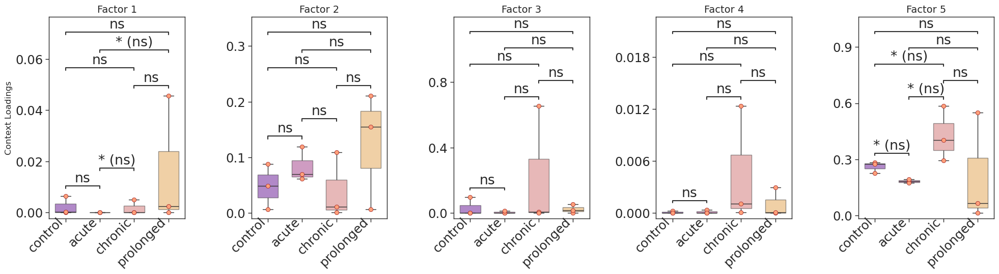

In [17]:
stage_effect_lung = spot_loadings_bulk_l[stage_effect["tissue"] == "lung"].copy()
stage_effect_lung["context"] = (stage_effect_lung["disease_group"].astype(str) + "_" + stage_effect_lung["tissue"].astype(str) + "_" 
                                + stage_effect_lung.groupby(["disease_group", "tissue"]).cumcount().astype(str))
stage_effect_lung_w = stage_effect_lung.pivot(index = "context", columns = "factor", values = "loading")

metadict = (stage_effect_lung[["context", "disease_group"]]
    .drop_duplicates()
    .set_index("context")["disease_group"]
    .to_dict())

fig, axes = c2c.plotting.context_boxplot(context_loadings = stage_effect_lung_w,
                                         metadict = metadict,
                                         verbose = True,
                                         group_order = ["control", "acute", "chronic", "prolonged"],
                                         statistical_test = "Kruskal",
                                         pval_correction = "fdr_bh",
                                         text_format = "star",
                                         cmap = "plasma",
                                         figsize = (20, 6))
for ax in axes.flatten():
    ax.yaxis.set_major_locator(ticker.MaxNLocator(nbins = 4))
fig.savefig("out/plots/NMF_condition_lung.svg", bbox_inches = "tight")

We can not perform formal hypothesis testing for LN samples because only one replicate is available per disease stage. However, visual inspection of the context loadings across disease stages suggests the following trends:

- Factor 1 appears highest in control
- Factor 2 peaks at the acute stage
- Factors 3 and 5 tend to increase across disease stages
- Factor 4 peaks in the chronic stage

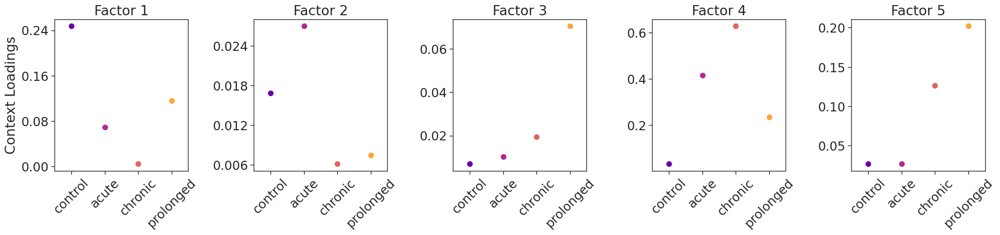

In [18]:
stage_effect_ln = spot_loadings_bulk_l[spot_loadings_bulk_l["tissue"] == "lymph-node"]

factors = stage_effect_ln["factor"].unique()
order = ["control", "acute", "chronic", "prolonged"]
palette = sns.color_palette("plasma", 4)

sns.set_theme(style = "ticks", context = "paper", font_scale = 2)
fig, axes = plt.subplots(1, 5, figsize = (20, 5), sharey = False)
for ax, factor in zip(axes, factors):
    data = stage_effect_ln[stage_effect_ln["factor"] == factor]
    sns.stripplot(data = data, x = "disease_group", y = "loading",
                  order =  order, hue = "disease_group", legend = False,
                  palette = dict(zip(order, palette)), size = 8, ax = ax)
    ax.set_title(factor)
    ax.set_xlabel("")
    ax.set_ylabel("Context Loadings" if ax == axes[0] else "")
    ax.tick_params(axis = 'x', rotation = 45)
for ax in axes.flatten():
    ax.yaxis.set_major_locator(ticker.MaxNLocator(nbins = 4))

plt.tight_layout()
plt.savefig("out/plots/NMF_condition_ln.svg", bbox_inches = "tight")
plt.show()

Finally, to have a global visualization of the spot loadings across samples, we can do a heatmap: 

/home/groups/singlecell/cvicente/miniconda3/envs/COVID_CCC/lib/python3.11/site-packages/seaborn/matrix.py:1107: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.


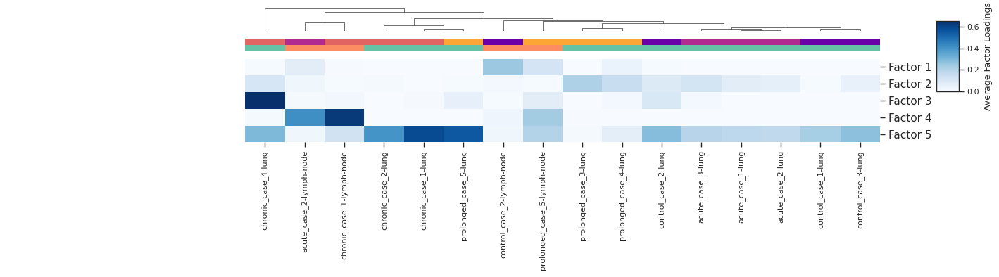

In [19]:
group_annotations = psbulk.obs["disease_group"].astype(str).values
group_labels = list(pd.unique(group_annotations))
group_cmap = dict(zip(group_labels, sns.color_palette("plasma", n_colors=len(group_labels))))
group_cols  = [group_cmap[x] for x in group_annotations]

tissue_annotations = psbulk.obs["tissue"].astype(str).values
tissue_labels = list(pd.unique(tissue_annotations))
tissue_cmap = dict(zip(tissue_labels, sns.color_palette("Set2", n_colors=len(tissue_labels))))
tissue_cols = [tissue_cmap[x] for x in tissue_annotations]

chart = sns.clustermap(psbulk.X.T,
    cmap = "Blues",
    row_cluster = False,
    col_cluster = True,
    col_colors = [group_cols, tissue_cols],
    figsize = (16, 2.5),  
    xticklabels = psbulk.obs.index,
    yticklabels = psbulk.var.index,
    cbar_pos = None,
    colors_ratio = 0.05
)

chart.ax_heatmap.set_yticklabels(chart.ax_heatmap.get_ymajorticklabels(), rotation = 0, fontdict = {"fontsize": 11})
chart.ax_heatmap.set_xticklabels(chart.ax_heatmap.get_xmajorticklabels(), fontsize = 8)

cbar_ax = chart.fig.add_axes([0.95, 0.4, 0.02, 0.4])  
cbar = plt.colorbar(chart.ax_heatmap.collections[0], cax = cbar_ax)
cbar.set_label("Average Factor Loadings", size = 9, loc = "center")
cbar.ax.tick_params(labelsize = 8)

plt.savefig("out/plots/spot_loadings_heatmap.svg", bbox_inches = "tight")
plt.show()

## LR loadings analysis

The LR loadings (H matrix) captures the contribution of each ligand-receptor pair to each factor, allowing us to identify the LR pairs that define each factor.

We can start by inspecting the top 10 loadings per factor.

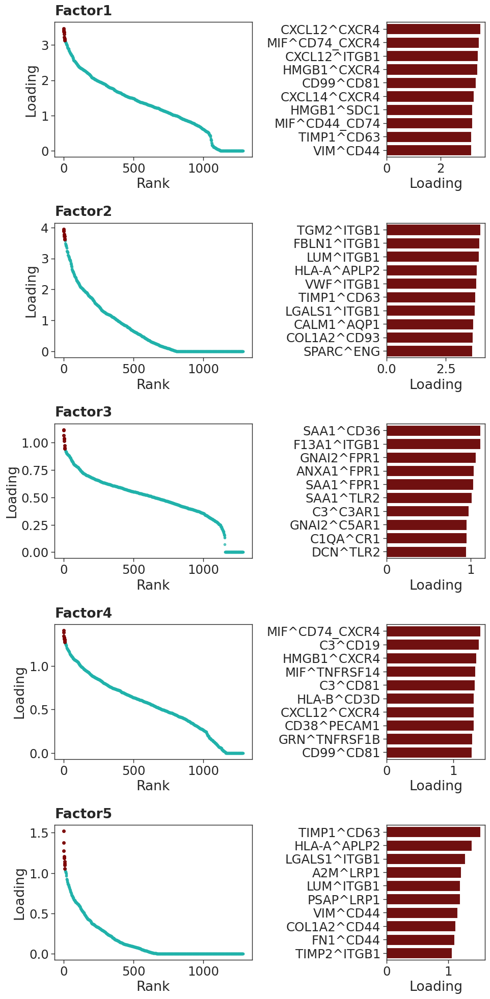

In [20]:
sns.set_theme(style = "ticks", context = "paper", font_scale = 2)
fig, axes = plt.subplots(nrows = 5, ncols = 2, figsize = (10, 20),
                         gridspec_kw = {"width_ratios": [2, 1]})

for i, fct in enumerate(lr_loadings.columns):
    df = lr_loadings[[fct]].copy().reset_index()
    df.columns = ['pair', 'loading']
    df = df.sort_values('loading', ascending = False).reset_index(drop = True)
    df['rank'] = df.index + 1

    ax = axes[i, 0]
    ax.scatter(df['rank'], df['loading'], s = 10, color = 'lightseagreen', alpha = 0.7)
    ax.scatter(df.head(10)['rank'],
               df.head(10)['loading'],
               s = 18,
               color = 'maroon',
               alpha = 0.9)
    ax.set_xlabel('Rank')
    ax.set_ylabel('Loading')
    ax.set_title('')

    ax2 = axes[i, 1]
    top10 = df.head(10).copy()
    sns.barplot(data = top10,
                x = 'loading',
                y = 'pair',
                ax = ax2,
                color = 'maroon')
    ax2.set_xlabel('Loading')
    ax2.set_ylabel('')
    ax2.set_title('')

    axes[i, 0].set_title(fct, fontweight = 'bold', loc = 'left', pad = 10)

plt.tight_layout()
plt.savefig("out/plots/LR_loadings_top10.svg", bbox_inches = "tight")
plt.show()

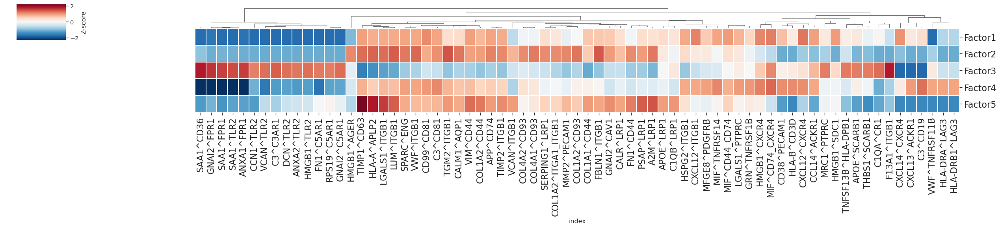

In [21]:
top_idx = set()
for factor in lr_loadings.columns:
    top_idx.update(lr_loadings[factor].abs().sort_values(ascending=False).head(20).index)
top_lr_loadings = lr_loadings.loc[list(top_idx)].copy()
z_lr_loadings = top_lr_loadings.apply(zscore, axis=0)

sns.set_theme(style = "ticks", context = "paper", font_scale=1.2)
g = sns.clustermap(z_lr_loadings.T,  
                   cmap = "RdBu_r",
                   center = 0,
                   col_cluster = True,
                   row_cluster = False,
                   linewidths = 0.3,
                   linecolor = "white",
                   yticklabels = True,
                   xticklabels = True,
                   figsize = (len(top_idx) * 0.35, 5), 
                   cbar_kws = {"label": "Z-score", "shrink": 0.5})
g.ax_heatmap.tick_params(axis = "x", labelsize = 16)
g.ax_heatmap.tick_params(axis = "y", labelsize = 16)
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(),
                             rotation = 0)
plt.savefig("out/plots/LR_loadings_heatmap.svg", bbox_inches = "tight")
plt.show()

In [22]:
lr_pairs = li.resource.select_resource('consensus')
lr_list = ['^'.join(row) for idx, row in lr_pairs.iterrows()]

results = {}
for db in ['Reactome', 'KEGG', 'GOBP']:
    lr_set = c2c.external.generate_lr_geneset(lr_list,
                                              complex_sep = '_',
                                              lr_sep = '^',
                                              organism = 'human',
                                              pathwaydb = db,
                                              readable_name = True,
                                              output_folder = f"out/enrichment/{db}/")

    pvals, scores, gsea_df = c2c.external.run_gsea(loadings = lr_loadings,
                                                   lr_set = lr_set,
                                                   output_folder = f"out/enrichment/{db}/",
                                                   weight = 1,
                                                   min_size = 15,
                                                   permutations = 1000,
                                                   processes = 6,
                                                   random_state = 42,
                                                   significance_threshold = 0.05)

    results[db] = {'lr_set': lr_set,
                   'pvals': pvals,
                   'scores': scores,
                   'gsea_df': gsea_df}

out/enrichment/Reactome/ already exists.


  0%|                                                     | 0/5 [00:00<?, ?it/s]2026-05-15 11:46:12,462 [WARNING] Duplicated values found in preranked stats: 12.78% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
 20%|█████████                                    | 1/5 [00:07<00:29,  7.47s/it]2026-05-15 11:46:19,930 [WARNING] Duplicated values found in preranked stats: 36.55% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
 40%|██████████████████                           | 2/5 [00:11<00:16,  5.42s/it]2026-05-15 11:46:23,920 [WARNING] Duplicated values found in preranked stats: 9.43% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
 60%|███████████████████████████                  | 3/5 [00:18<00:12,  6.15s/it]2026-05-15 11:46:30,935 [WARNING] Duplicated values found in preranked stats: 9.90% of genes
The order of those genes will be arbitrary, which may produc

out/enrichment/KEGG/ already exists.


  0%|                                                     | 0/5 [00:00<?, ?it/s]2026-05-15 11:46:35,262 [WARNING] Duplicated values found in preranked stats: 12.78% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
 20%|█████████                                    | 1/5 [00:00<00:03,  1.03it/s]2026-05-15 11:46:36,233 [WARNING] Duplicated values found in preranked stats: 36.55% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
 40%|██████████████████                           | 2/5 [00:02<00:04,  1.48s/it]2026-05-15 11:46:38,077 [WARNING] Duplicated values found in preranked stats: 9.43% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
 60%|███████████████████████████                  | 3/5 [00:05<00:03,  1.82s/it]2026-05-15 11:46:40,290 [WARNING] Duplicated values found in preranked stats: 9.90% of genes
The order of those genes will be arbitrary, which may produc

out/enrichment/GOBP/ already exists.


  0%|                                                     | 0/5 [00:00<?, ?it/s]2026-05-15 11:46:43,350 [WARNING] Duplicated values found in preranked stats: 12.78% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
 20%|█████████                                    | 1/5 [00:05<00:22,  5.61s/it]2026-05-15 11:46:48,958 [WARNING] Duplicated values found in preranked stats: 36.55% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
 40%|██████████████████                           | 2/5 [00:13<00:21,  7.04s/it]2026-05-15 11:46:56,999 [WARNING] Duplicated values found in preranked stats: 9.43% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
 60%|███████████████████████████                  | 3/5 [00:21<00:15,  7.54s/it]2026-05-15 11:47:05,139 [WARNING] Duplicated values found in preranked stats: 9.90% of genes
The order of those genes will be arbitrary, which may produc

In [23]:
with open('out/enrichment/gsea_results.pkl', 'wb') as f:
    pickle.dump(results, f)

In [24]:
def combined_dot_plot(results, databases, significance=0.05, xlabel='', cbar_title='NES',
                      cmap='coolwarm', label_size=20, title_size=20, tick_size=12,
                      min_row_height=0.3, figsize=None, filename=None):
    processed = {}
    for db in databases:
        pval_df = results[db]['pvals']
        score_df = results[db]['scores']

        df = pval_df.lt(significance).astype(int)
        df = df.loc[(df != 0).any(axis=1)]
        df = df.T.loc[(df != 0).any(axis=0)].T
        pval_filtered = pval_df[df.columns].loc[df.index].applymap(lambda x: -1. * np.log10(x + 1e-9))
        score_filtered = score_df[df.columns].loc[df.index]
        processed[db] = (pval_filtered, score_filtered)

    all_scores = np.concatenate([processed[db][1].values.flatten() for db in databases])
    max_abs = np.max(np.abs(all_scores[~np.isnan(all_scores)]))
    norm = mpl.colors.Normalize(vmin=-max_abs, vmax=max_abs)
    max_size = mpl.colors.Normalize(vmin=0., vmax=3)
    cmap_obj = mpl.colormaps[cmap]

    n_rows_list = [len(processed[db][0].index) for db in databases]
    n_cols_list = [len(processed[db][0].columns) for db in databases]

    ref_height = 1.2
    panel_heights = [max(3, n * min_row_height) for n in n_rows_list]

    if figsize is None:
        width = max(10, min(24, max(n_cols_list) * 0.4 + 4))
        total_height = sum(panel_heights) + ref_height + 1.5
        figsize = (width, total_height)

    height_ratios = [ref_height] + panel_heights
    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(len(databases) + 1, 1, height_ratios=height_ratios, hspace=0.05)

    ax_legend = fig.add_subplot(gs[0])
    axes = [fig.add_subplot(gs[i+1]) for i in range(len(databases))]

    for ax, db in zip(axes, databases):
        pval_df, score_df = processed[db]

        col_order = {col: j for j, col in enumerate(pval_df.columns)}
        sort_key = pval_df.apply(lambda row: col_order[row.idxmax()], axis=1)
        pval_df = pval_df.loc[sort_key.sort_values(ascending=True).index]
        score_df = score_df.loc[pval_df.index]

        n_rows = len(pval_df.index)
        n_cols = len(pval_df.columns)

        for i, idx in enumerate(pval_df.index):
            for j, col in enumerate(pval_df.columns):
                color = np.asarray(cmap_obj(norm(score_df[[col]].loc[[idx]].values.item()))).reshape(1, -1)
                v = pval_df[[col]].loc[[idx]].values.item()
                size = ((max_size(np.min([v, 3])) * tick_size * 2) ** 2)
                ax.scatter(j, i, s=size, c=color)

        ax.set_xticks(range(n_cols))
        ax.set_xticklabels(list(pval_df.columns), fontsize=tick_size,
                           rotation=90, rotation_mode='anchor', va='center', ha='right')
        ax.set_yticks(range(n_rows))
        ax.set_yticklabels(list(pval_df.index), fontsize=tick_size, ha='right', va='center')
        ax.set_xlim(-0.5, n_cols - 0.5)
        ax.set_ylim(-0.5, n_rows - 0.5)
        ax.invert_yaxis()
        ax.set_ylabel(db, fontsize=label_size)
        ax.tick_params(bottom=True, top=False, right=False, left=True)
        if db != databases[-1]:
            ax.set_xticks(range(n_cols))
            ax.set_xticklabels([])          
            ax.tick_params(bottom=False)    
        else:
            ax.set_xticks(range(n_cols))
            ax.set_xticklabels(list(pval_df.columns), fontsize=tick_size,
                               rotation=90, rotation_mode='anchor', va='center', ha='right')
            ax.tick_params(bottom=True)

    divider = make_axes_locatable(axes[0])
    cax = divider.append_axes("top", size="8%", pad=0.21)
    cbar = plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap_obj),
                        cax=cax, orientation='horizontal')
    cbar.ax.tick_params(labelsize=tick_size)
    cax.tick_params(axis='x', bottom=False, top=True, labelbottom=False, labeltop=True)
    cax.set_title(cbar_title, fontsize=title_size)

    all_pvals = np.concatenate([processed[db][0].values.flatten() for db in databases])
    min_pval_shown = np.max([np.nanmin(all_pvals), -np.log10(0.99)])
    threshold_pval = -np.log10(significance + 1e-9)
    pval_values = [min_pval_shown, threshold_pval, 3.0]
    labels = ['', 'Threshold: ', '>=']

    for i, (v, extra) in enumerate(zip(pval_values, labels)):
        size = (max_size(np.min([v, 3.])) * tick_size * 2) ** 2
        ax_legend.scatter(i, 0.15, s=size, c='k')
        ax_legend.annotate(extra + str(np.round(abs(v), 4)), (i, 0.35),  
                           fontsize=tick_size, ha='center', va='bottom')

    ax_legend.set_xlim(-0.5, 2.5)
    ax_legend.set_ylim(-0.2, 0.6)   
    ax_legend.axis('off')
    ax_legend.set_title('-log10(P-value) sizes', fontsize=title_size, pad=1)

    if filename is not None:
        plt.savefig(filename, dpi=300, bbox_inches='tight')

    return fig

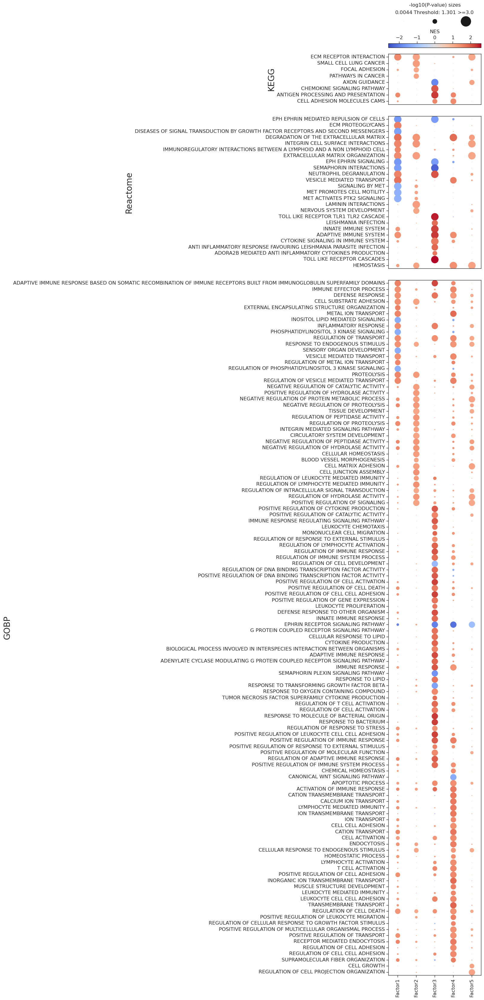

In [25]:
_ = combined_dot_plot(results = results,
                        databases  = ['KEGG', 'Reactome', 'GOBP'],
                        significance = 0.05,
                        xlabel = '',
                        cbar_title = 'NES',
                        cmap = 'coolwarm',
                        label_size = 20,
                        title_size = 12,
                        figsize = (4, 42),
                        tick_size = 12,
                        filename = 'out/plots/enrichment_dotplot.svg')
plt.show()

To improve the interpretability of the pathway enrichment results, we will perform a manual curation step following GSEA. This step aims to refine the output by removing pathways that are not informative for the biological question under study.

Specifically, pathways will be filtered based on the following criteria:
- **Irrelevant terms:** Pathways not related to the biological context of the dataset or research objective were excluded (e.g., disease-specific pathways or processes from unrelated tissues or systems).
- **Redundant terms:** Overlapping or highly similar pathways representing the same biological process were consolidated to reduce redundancy and improve clarity.
- **Broad terms:** Generic or overly broad terms (e.g., general regulation or signaling categories) that do not provide specific mechanistic insight were removed.

This curation step ensures that the final set of pathways reflects specific, biologically relevant, and non-redundant processes, facilitating clearer downstream interpretation.

In [26]:
drop_dict = {'KEGG':  ["SMALL CELL LUNG CANCER", "PATHWAYS IN CANCER", "AXON GUIDANCE"],
             
             'Reactome':["ADAPTIVE IMMUNE SYSTEM", "INNATE IMMUNE SYSTEM", "NERVOUS SYSTEM DEVELOPMENT", "ANTI INFLAMMATORY RESPONSE FAVOURING LEISHMANIA PARASITE INFECTION",
                         "LEISHMANIA INFECTION", "ADORA2B MEDIATED ANTI INFLAMMATORY CYTOKINES PRODUCTION", "VESICLE MEDIATED TRANSPORT", "CYTOKINE SIGNALING IN IMMUNE SYSTEM",
                         "LAMININ INTERACTIONS", "EPH EPHRIN SIGNALING", "EPH EPHRIN MEDIATED REPULSION OF CELLS", "SEMAPHORIN INTERACTIONS", "TOLL LIKE RECEPTOR CASCADES"
                         "DISEASES OF SIGNAL TRANSDUCTION BY GROWTH FACTORS", "MET PROMOTES CELL MOTILITY", "SIGNALING BY MET", "MET ACTIVATES PTK2 SIGNALING"],
             
             'GOBP':["REGULATION OF LYMPHOCYTE MEDIATED IMMUNITY", "RESPONSE TO MOLECULE OF BACTERIAL ORIGIN", "BIOLOGICAL PROCESS INVOLVED IN INTERSPECIES INTERACTION BETWEEN ORGANISMS",
                     "INTEGRIN MEDIATED SIGNALING PATHWAY", "REGULATION OF METAL ION TRANSPORT", "REGULATION OF PHOSPHATIDYLINOSITOL 3 KINASE SIGNALING", 
                     "REGULATION OF LEUKOCYTE MEDIATED IMMUNITY", "IMMUNE RESPONSE", "REGULATION OF IMMUNE RESPONSE", "REGULATION OF ADAPTIVE IMMUNE RESPONSE",
                     "REGULATION OF CELL ACTIVATION", "REGULATION OF T CELL ACTIVATION", "REGULATION OF LYMPHOCYTE ACTIVATION", "RESPONSE TO LIPID", 
                     "LEUKOCYTE MEDIATED IMMUNITY", "ACTIVATION OF IMMUNE RESPONSE", "REGULATION OF TRANSPORT", "POSITIVE REGULATION OF TRANSPORT", 
                     "REGULATION OF VESICLE MEDIATED TRANSPORT", "VESICLE MEDIATED TRANSPORT", "POSITIVE REGULATION OF GENE EXPRESSION", "POSITIVE REGULATION OF MOLECULAR FUNCTION",
                     "POSITIVE REGULATION OF CATALYTIC ACTIVITY", "POSITIVE REGULATION OF SIGNALING", "REGULATION OF INTRACELLULAR SIGNAL TRANSDUCTION",
                     "NEGATIVE REGULATION OF CATALYTIC ACTIVITY", "REGULATION OF HYDROLASE ACTIVITY", "POSITIVE REGULATION OF HYDROLASE ACTIVITY",
                     "NEGATIVE REGULATION OF HYDROLASE ACTIVITY", "NEGATIVE REGULATION OF PEPTIDASE ACTIVITY", "REGULATION OF PEPTIDASE ACTIVITY",
                     "NEGATIVE REGULATION OF PROTEOLYSIS", "REGULATION OF PROTEOLYSIS", "NEGATIVE REGULATION OF PROTEIN METABOLIC PROCESS",
                     "RESPONSE TO ENDOGENOUS STIMULUS", "CELLULAR RESPONSE TO ENDOGENOUS STIMULUS", "HOMEOSTATIC PROCESS",
                     "CHEMICAL HOMEOSTASIS", "CELLULAR HOMEOSTASIS", "POSITIVE REGULATION OF MULTICELLULAR ORGANISMAL PROCESS",
                     "REGULATION OF DNA BINDING TRANSCRIPTION FACTOR ACTIVITY", "POSITIVE REGULATION OF DNA BINDING TRANSCRIPTION FACTOR ACTIVITY",
                     "REGULATION OF CELLULAR RESPONSE TO GROWTH FACTOR", "SENSORY ORGAN DEVELOPMENT", "MUSCLE STRUCTURE DEVELOPMENT", "CELL GROWTH", 
                     "REGULATION OF CELL PROJECTION ORGANIZATION", "TISSUE DEVELOPMENT", "EXTERNAL ENCAPSULATING STRUCTURE ORGANIZATION", 
                     "REGULATION OF CELL DEVELOPMENT", "CIRCULATORY SYSTEM DEVELOPMENT", "EPHRIN RECEPTOR SIGNALING PATHWAY", "SEMAPHORIN PLEXIN SIGNALING PATHWAY", 
                     "INOSITOL LIPID MEDIATED SIGNALING", "CANONICAL WNT SIGNALING PATHWAY", "ADENYLATE CYCLASE MODULATING G PROTEIN COUPLED RECEPTOR SIGNALING PATHWAY", 
                     "G PROTEIN COUPLED RECEPTOR SIGNALING PATHWAY", "REGULATION OF RESPONSE TO STRESS", "REGULATION OF RESPONSE TO EXTERNAL STIMULUS", 
                     "POSITIVE REGULATION OF RESPONSE TO EXTERNAL STIMULUS", "TRANSMEMBRANE TRANSPORT", "CATION TRANSPORT", "ION TRANSMEMBRANE TRANSPORT", 
                     "ION TRANSPORT", "INORGANIC ION TRANSMEMBRANE TRANSPORT", "CELL SUBSTRATE ADHESION", "POSITIVE REGULATION OF CELL ADHESION", 
                     "REGULATION OF CELL ADHESION", "REGULATION OF CELL CELL ADHESION", "POSITIVE REGULATION OF CELL CELL ADHESION", 
                     "POSITIVE REGULATION OF LEUKOCYTE CELL CELL ADHESION", "CELL CELL ADHESION", "IMMUNE RESPONSE REGULATING SIGNALING PATHWAY", 
                     "POSITIVE REGULATION OF IMMUNE RESPONSE", "REGULATION OF IMMUNE SYSTEM PROCESS", "POSITIVE REGULATION OF IMMUNE SYSTEM PROCESS", "CELL ACTIVATION", 
                     "POSITIVE REGULATION OF CELL ACTIVATION", "DEFENSE RESPONSE", "RESPONSE TO BACTERIUM", "BIOLOGICAL PROCESS INVOLVED IN INTERSPECIES INTERACTION",
                     "POSITIVE REGULATION OF CYTOKINE PRODUCTION", "MONONUCLEAR CELL MIGRATION",  "ENDOCYTOSIS", "POSITIVE REGULATION OF CELL DEATH", 
                     "REGULATION OF CELL DEATH"]}

for db, drop_set in drop_dict.items():
    mask = ~results[db]['gsea_df']['Term'].str.upper().isin(drop_set)
    results[db]['gsea_df'] = results[db]['gsea_df'][mask]
    
    for key in ['scores', 'pvals']:
        results[db][key] = results[db][key][~results[db][key].index.str.upper().isin(drop_set)]
    
    results[db]['lr_set'] = {k: v for k, v in results[db]['lr_set'].items() if k.upper() not in drop_set} 
    
    print(f"{db}: {len(drop_set)} terms dropped")
    display(results[db]['gsea_df'].loc[(results[db]['gsea_df']['Adj. P-value'] < 0.05)])

KEGG: 3 terms dropped


,Factor,Term,NES,P-value,Adj. P-value
0,Factor1,ANTIGEN PROCESSING AND PRESENTATION,1.522514,0.010000,0.042857
1,Factor1,ECM RECEPTOR INTERACTION,1.504179,0.000999,0.008938
13,Factor2,ECM RECEPTOR INTERACTION,1.187674,0.000999,0.008938
16,Factor2,FOCAL ADHESION,1.109176,0.006000,0.032793
24,Factor3,ANTIGEN PROCESSING AND PRESENTATION,2.276862,0.000999,0.008938
25,Factor3,CHEMOKINE SIGNALING PATHWAY,2.015744,0.001043,0.008938
27,Factor3,CELL ADHESION MOLECULES CAMS,1.529794,0.009018,0.041622
36,Factor4,ANTIGEN PROCESSING AND PRESENTATION,1.562534,0.006012,0.032793
37,Factor4,CELL ADHESION MOLECULES CAMS,1.463212,0.003000,0.022500
49,Factor5,ECM RECEPTOR INTERACTION,1.122217,0.000999,0.008938


Reactome: 16 terms dropped


,Factor,Term,NES,P-value,Adj. P-value
0,Factor1,DEGRADATION OF THE EXTRACELLULAR MATRIX,1.806874,0.000999,0.007427
4,Factor1,ECM PROTEOGLYCANS,1.592107,0.000999,0.007427
5,Factor1,NEUTROPHIL DEGRANULATION,1.583187,0.001000,0.007427
7,Factor1,INTEGRIN CELL SURFACE INTERACTIONS,1.543953,0.000999,0.007427
8,Factor1,IMMUNOREGULATORY INTERACTIONS BETWEEN A LYMPHO...,1.533845,0.003000,0.018158
9,Factor1,DISEASES OF SIGNAL TRANSDUCTION BY GROWTH FACT...,-1.530723,0.000999,0.007427
10,Factor1,EXTRACELLULAR MATRIX ORGANIZATION,1.471425,0.000999,0.007427
46,Factor2,DEGRADATION OF THE EXTRACELLULAR MATRIX,1.364443,0.001000,0.007427
47,Factor2,INTEGRIN CELL SURFACE INTERACTIONS,1.350841,0.000999,0.007427
48,Factor2,EXTRACELLULAR MATRIX ORGANIZATION,1.251608,0.000999,0.007427


GOBP: 86 terms dropped


,Factor,Term,NES,P-value,Adj. P-value
1,Factor1,ADAPTIVE IMMUNE RESPONSE BASED ON SOMATIC RECO...,1.603037,0.001000,0.016238
5,Factor1,METAL ION TRANSPORT,1.550368,0.001000,0.016238
7,Factor1,PROTEOLYSIS,1.523017,0.001000,0.016238
21,Factor1,INFLAMMATORY RESPONSE,1.447864,0.001000,0.016238
31,Factor1,IMMUNE EFFECTOR PROCESS,1.405830,0.001000,0.016238
56,Factor1,PHOSPHATIDYLINOSITOL 3 KINASE SIGNALING,-1.322144,0.000999,0.016238
355,Factor2,CELL JUNCTION ASSEMBLY,1.384716,0.000999,0.016238
365,Factor2,PROTEOLYSIS,1.282463,0.000999,0.016238
375,Factor2,CELL MATRIX ADHESION,1.219736,0.001000,0.016238
402,Factor2,BLOOD VESSEL MORPHOGENESIS,1.151223,0.004000,0.047948


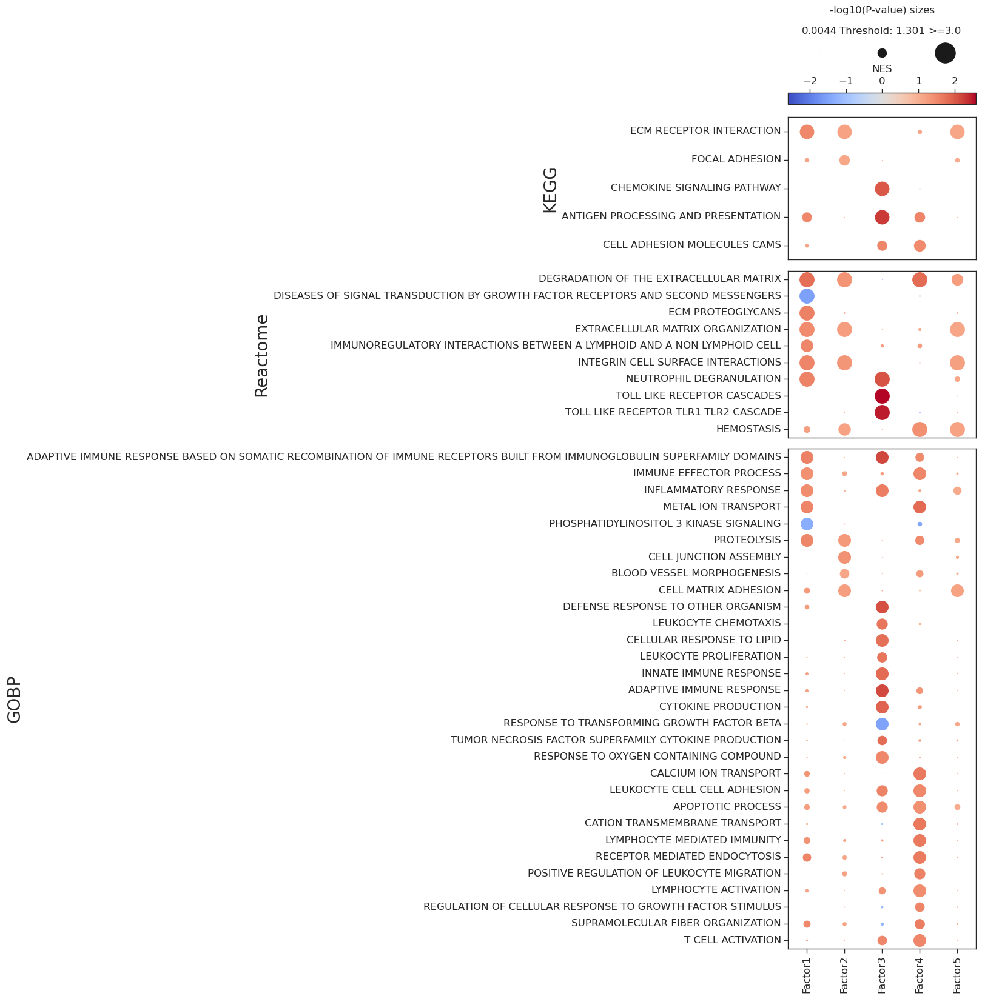

In [27]:
_ = combined_dot_plot(results = results,
                        databases  = ['KEGG', 'Reactome', 'GOBP'],
                        significance = 0.05,
                        xlabel = '',
                        cbar_title = 'NES',
                        cmap = 'coolwarm',
                        label_size = 20,
                        title_size = 12,
                        figsize = (4, 20),
                        tick_size = 12,
                        filename = 'out/plots/enrichment_dotplot_curated.svg')
plt.show()

# Session information

In [28]:
import session_info
session_info.show()